In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly_express as px 
from sklearn.preprocessing import MinMaxScaler
import plotly.figure_factory as ff
from scipy.cluster.hierarchy import dendrogram, linkage
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import pickle
import warnings
warnings.ignore=True
from IPython.display import display
from sklearn.linear_model import LogisticRegression

In [2]:
purchase_data=pd.read_csv('purchase data.csv')
purchase_data.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Promotion_3,Promotion_4,Promotion_5,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,200000001,1,0,0,0,0,0,1.59,1.87,2.01,...,0,0,0,0,0,47,1,110866,1,0
1,200000001,11,0,0,0,0,0,1.51,1.89,1.99,...,0,0,0,0,0,47,1,110866,1,0
2,200000001,12,0,0,0,0,0,1.51,1.89,1.99,...,0,0,0,0,0,47,1,110866,1,0
3,200000001,16,0,0,0,0,0,1.52,1.89,1.98,...,0,0,0,0,0,47,1,110866,1,0
4,200000001,18,0,0,0,0,0,1.52,1.89,1.99,...,0,0,0,0,0,47,1,110866,1,0


In [3]:
scalar=pickle.load(open('scalar.pickle','rb'))

C:\Users\adadi\anaconda3\envs\DataScienceEnv\lib\site-packages\sklearn\base.py:348: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.4.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [4]:
pca=pickle.load(open('pca.pickle','rb'))

C:\Users\adadi\anaconda3\envs\DataScienceEnv\lib\site-packages\sklearn\base.py:348: InconsistentVersionWarning: Trying to unpickle estimator PCA from version 1.4.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [5]:
kmeans=pickle.load(open('kmeans.pickle','rb'))


C:\Users\adadi\anaconda3\envs\DataScienceEnv\lib\site-packages\sklearn\base.py:348: InconsistentVersionWarning: Trying to unpickle estimator KMeans from version 1.4.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


* `segment-1`: This segment is characterized by `single males`, with `relatively high income and occupation status`, and they tend to live in `larger settlements`. 
* `segment-2`: This segment is characterized by `married females`, with `moderate income and occupation status`, and they tend to live in `smaller settlements`.
* `segment-3`: This segment is characterized by `married males`, with `high education, income, and occupation status`, and they tend to live in `larger settlements`.
* `segment-4`: This segment is characterized by `single females`, with `lower income and occupation status`, and they tend to live in much `smaller settlements`.

## Transforming Purchase Data (scalar(standardization), pca, kmeans)

In [6]:
CustomerDemographicData=purchase_data[['ID'	,'Sex',	'Marital status','Age','Education','Income','Occupation','Settlement size']]

CustomerDemographicData=CustomerDemographicData.groupby(['ID']).mean()

## standardization
DemographicData=scalar.transform(CustomerDemographicData)

## pca transformation
CustomerDemographicData[['Gender(-)_MaritalStatus(-)','Life_Work_Experience(+)','Gender(+)_Married(-)']]=pca.transform(DemographicData)

## segmentation
CustomerDemographicData['Segmentation_K_means']=kmeans.predict(CustomerDemographicData.iloc[:,-3:])

CustomerDemographicData.head()

C:\Users\adadi\anaconda3\envs\DataScienceEnv\lib\site-packages\sklearn\base.py:458: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
C:\Users\adadi\anaconda3\envs\DataScienceEnv\lib\site-packages\sklearn\base.py:458: UserWarning: X has feature names, but KMeans was fitted without feature names
  warnings.warn(


,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,Gender(-)_MaritalStatus(-),Life_Work_Experience(+),Gender(+)_Married(-),Segmentation_K_means
ID,,,,,,,,,,,
200000001,0.0,0.0,47.0,1.0,110866.0,1.0,0.0,0.562556,-0.423674,-0.084318,0
200000002,1.0,1.0,52.0,2.0,159052.0,2.0,1.0,-0.576534,0.680160,0.241501,1
200000003,0.0,0.0,28.0,0.0,113212.0,1.0,0.0,0.571322,-0.476422,-0.092157,0
200000004,0.0,0.0,37.0,1.0,119602.0,0.0,0.0,0.477406,-0.678954,-0.185573,0
200000005,0.0,0.0,49.0,1.0,121466.0,1.0,2.0,0.834888,0.298987,0.150102,0


# Brand Choice

#### Creating a mulitclass Logistic regression Model to predict which brand customer would like to purchase With Maximum Probability.
* In THis Phase customer purhase behaviour for Brand choice would be Analyzed with an Ansumption that the customer already decided to purchase categorgy of product.
* input: 'Price_1','Price_2','Price_3','Price_4','Price_5'
* output: Brand category: 1,2,3,4, and 5
  

In [7]:
price=['Price_1','Price_2','Price_3','Price_4','Price_5']
df_brandChoice=purchase_data[purchase_data['Incidence']==1]
df_brandChoice.head()
Y_train=df_brandChoice['Brand'].values
X_train=df_brandChoice[price].values
print('shape of the X_train,Y_train',X_train.shape,Y_train.shape)
model_brandchoice=LogisticRegression(solver='sag',multi_class='multinomial').fit(X_train,Y_train)


shape of the X_train,Y_train (14638, 5) (14638,)


* IN this numpy array the coefficient of each price input for five different brand output exist.
* for each specific brand prediction, for example for brand 1 the coefficient of each price input is present in first row. similarly for other brand the coeffcienct are present in respective rows .

In [8]:
model_brandchoice.coef_

array([[-3.91596204,  0.6584574 ,  2.41768805,  0.70408169, -0.20211807],
       [ 1.27461709, -1.87985355, -0.21262413, -0.20633834,  0.58787616],
       [ 1.62417701,  0.56210482,  0.50084783,  1.03950213,  0.4527779 ],
       [ 0.57454351,  0.39559089, -1.40058035, -1.24624046,  0.24935813],
       [ 0.44262444,  0.26370045, -1.30533139, -0.29100502, -1.08789412]])

* Lets transpose the coef_ matrix to visualize it clearly with a data frame
* Here Column name representing the output brand no
* And index values representing the coefficient of corresponding price variable.
* For instance To predict the 'Brand_1' with probability value then that probability value is calculated by usning coefficients of Value of 'Brand_1'.
* Similarly the probability of others other Brand is calculated.
##### Note:
>* It is observed that the probability of customer purchasing Brand_1 is depend upon price of all other Brand as well as it own price but this probability of purchase is depend negatively with own Brand price. reason is if price of the a brand will incrase then purchase probability of that brand will decrease.
>* Coeff of Brand_1 and Price_1 is -3.91.
>* Coeff of Brand_2 and Price_2 is -1.87.
>* Coeff of Brand_3 and Price_3 is +0.5.
>* Coeff of Brand_4 and Price_4 is -1.24.
>* Coeff of Brand_5 and Price_5 is -1.087.
>* Most of times probability of purchase of a specific brand is depend positively with price of the other brand. So it means that If the price of the other brand will increae then purchase probabilit of the given brand will increase.



In [9]:
df_brandchoice_coef_=pd.DataFrame(np.transpose(model_brandchoice.coef_))
df_brandchoice_coef_.index=price
df_brandchoice_coef_.columns=['Brand_1','Brand_2','Brand_3','Brand_4','Brand_5']
df_brandchoice_coef_

,Brand_1,Brand_2,Brand_3,Brand_4,Brand_5
Price_1,-3.915962,1.274617,1.624177,0.574544,0.442624
Price_2,0.658457,-1.879854,0.562105,0.395591,0.263700
Price_3,2.417688,-0.212624,0.500848,-1.400580,-1.305331
Price_4,0.704082,-0.206338,1.039502,-1.246240,-0.291005
Price_5,-0.202118,0.587876,0.452778,0.249358,-1.087894


In [10]:
PriceRange=np.arange(0.5,3.5,0.01)
PriceRange.shape

(300,)

In [11]:
PE_BrandChoice=pd.DataFrame(index=np.arange(PriceRange.size))
PE_BrandChoice['MeanPriceBrand1']=purchase_data['Price_1'].mean()
PE_BrandChoice['MeanPriceBrand2']=purchase_data['Price_2'].mean()
PE_BrandChoice['MeanPriceBrand3']=purchase_data['Price_3'].mean()
PE_BrandChoice['MeanPriceBrand4']=purchase_data['Price_4'].mean()
PE_BrandChoice['MeanPriceBrand5']=purchase_data['Price_5'].mean()

PE_BrandChoice['PriceBrand1']=PriceRange.reshape((-1,1))
PE_BrandChoice['PriceBrand2']=PriceRange.reshape((-1,1))
PE_BrandChoice['PriceBrand3']=PriceRange.reshape((-1,1))
PE_BrandChoice['PriceBrand4']=PriceRange.reshape((-1,1))
PE_BrandChoice['PriceBrand5']=PriceRange.reshape((-1,1))
PE_BrandChoice.head()

,MeanPriceBrand1,MeanPriceBrand2,MeanPriceBrand3,MeanPriceBrand4,MeanPriceBrand5,PriceBrand1,PriceBrand2,PriceBrand3,PriceBrand4,PriceBrand5
0,1.392074,1.780999,2.006789,2.159945,2.654798,0.50,0.50,0.50,0.50,0.50
1,1.392074,1.780999,2.006789,2.159945,2.654798,0.51,0.51,0.51,0.51,0.51
2,1.392074,1.780999,2.006789,2.159945,2.654798,0.52,0.52,0.52,0.52,0.52
3,1.392074,1.780999,2.006789,2.159945,2.654798,0.53,0.53,0.53,0.53,0.53
4,1.392074,1.780999,2.006789,2.159945,2.654798,0.54,0.54,0.54,0.54,0.54


# Own and Cross Price Elasticity of Purchase Probability(by Aggregating all customer of each segment)

In [12]:
PE_BrandChoice.columns

Index(['MeanPriceBrand1', 'MeanPriceBrand2', 'MeanPriceBrand3',
       'MeanPriceBrand4', 'MeanPriceBrand5', 'PriceBrand1', 'PriceBrand2',
       'PriceBrand3', 'PriceBrand4', 'PriceBrand5'],
      dtype='object')

In [13]:
meanBrandPrice={
    1:'MeanPriceBrand1',
    2:'MeanPriceBrand2',
    3:'MeanPriceBrand3',
    4:'MeanPriceBrand4',
    5:'MeanPriceBrand5'
}
PriceBrand={
    1: 'PriceBrand1',
    2: 'PriceBrand2',
    3: 'PriceBrand3',
    4: 'PriceBrand4',
    5: 'PriceBrand5',
}
def OwnPriceEls_Input(brandInd,TotalNoOfBrand=5):
    # lsit of own price elasticity
    listForOwnPriceEls=[]
    for i in range(1,TotalNoOfBrand+1):
        if i ==brandInd:
            listForOwnPriceEls.append(PriceBrand[i])
        else:
            listForOwnPriceEls.append(meanBrandPrice[i])
    return listForOwnPriceEls
def CrossPriceEls_Input(CrossbrandInd,TotalNoOfBrand=5):
    listForCrsPriceEls=[]
    for i in range(1,TotalNoOfBrand+1):
        if i ==CrossbrandInd:
            listForCrsPriceEls.append(PriceBrand[i])
        else:
            listForCrsPriceEls.append(meanBrandPrice[i])
    return listForCrsPriceEls    
    
for brand in range(5,0,-1):
    print("selection of Brand...",brand)
   
    for crossbrand in range(5,0,-1):
        if crossbrand==brand:
            beta=df_brandchoice_coef_.iloc[brand-1,brand-1]
            ownpriceList=OwnPriceEls_Input(brand)
            print(f"Calculating Own price Elasticity of brand {brand}")
            print(f'column extracted',ownpriceList)
            print(f'beta value of Brand{brand}',beta)
            PE_BrandChoice[f'OwnPEBrand{brand}']=beta*PE_BrandChoice[f'PriceBrand{brand}'].values*(1-model_brandchoice.predict_proba(PE_BrandChoice[ownpriceList].values)[:,brand-1])
            print(f"Own price elasticity of brand{brand} is finished..")
        else:
            beta=df_brandchoice_coef_.iloc[crossbrand-1,brand-1]
            crosspriceList=CrossPriceEls_Input(crossbrand)
            print(f"column extracted",crosspriceList)
            print(f"Calculating Cross Price Elasticity of brand{brand} with cross price of brand{crossbrand}...")
            print(f'beta value of brand{crossbrand} is ',beta)
            PE_BrandChoice[f"CrossPEBrand_{brand}_withCrsBrand{crossbrand}"]=beta*PE_BrandChoice[f'PriceBrand{crossbrand}'].values*(1-model_brandchoice.predict_proba(PE_BrandChoice[crosspriceList].values)[:,brand-1])
            print(f"calculation of cross price elasticity of Brand{brand} with cross price of Brand{crossbrand} is finished...")            
    
    

selection of Brand... 5
Calculating Own price Elasticity of brand 5
column extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'MeanPriceBrand3', 'MeanPriceBrand4', 'PriceBrand5']
beta value of Brand5 -1.0878941234837758
Own price elasticity of brand5 is finished..
column extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'MeanPriceBrand3', 'PriceBrand4', 'MeanPriceBrand5']
Calculating Cross Price Elasticity of brand5 with cross price of brand4...
beta value of brand4 is  -0.2910050226087954
calculation of cross price elasticity of Brand5 with cross price of Brand4 is finished...
column extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'PriceBrand3', 'MeanPriceBrand4', 'MeanPriceBrand5']
Calculating Cross Price Elasticity of brand5 with cross price of brand3...
beta value of brand3 is  -1.305331391208926
calculation of cross price elasticity of Brand5 with cross price of Brand3 is finished...
column extracted ['MeanPriceBrand1', 'PriceBrand2', 'MeanPriceBrand3', 'MeanPriceBrand4', 'MeanPrice

In [14]:
purchase_data[price].describe()

,Price_1,Price_2,Price_3,Price_4,Price_5
count,58693.000000,58693.000000,58693.000000,58693.000000,58693.000000
mean,1.392074,1.780999,2.006789,2.159945,2.654798
std,0.091139,0.170868,0.046867,0.089825,0.098272
min,1.100000,1.260000,1.870000,1.760000,2.110000
25%,1.340000,1.580000,1.970000,2.120000,2.630000
50%,1.390000,1.880000,2.010000,2.170000,2.670000
75%,1.470000,1.890000,2.060000,2.240000,2.700000
max,1.590000,1.900000,2.140000,2.260000,2.800000


In [15]:
pd.options.display.max_columns=None
display(PE_BrandChoice.head())

,MeanPriceBrand1,MeanPriceBrand2,MeanPriceBrand3,MeanPriceBrand4,MeanPriceBrand5,PriceBrand1,PriceBrand2,PriceBrand3,PriceBrand4,PriceBrand5,OwnPEBrand5,CrossPEBrand_5_withCrsBrand4,CrossPEBrand_5_withCrsBrand3,CrossPEBrand_5_withCrsBrand2,CrossPEBrand_5_withCrsBrand1,CrossPEBrand_4_withCrsBrand5,OwnPEBrand4,CrossPEBrand_4_withCrsBrand3,CrossPEBrand_4_withCrsBrand2,CrossPEBrand_4_withCrsBrand1,CrossPEBrand_3_withCrsBrand5,CrossPEBrand_3_withCrsBrand4,OwnPEBrand3,CrossPEBrand_3_withCrsBrand2,CrossPEBrand_3_withCrsBrand1,CrossPEBrand_2_withCrsBrand5,CrossPEBrand_2_withCrsBrand4,CrossPEBrand_2_withCrsBrand3,OwnPEBrand2,CrossPEBrand_2_withCrsBrand1,CrossPEBrand_1_withCrsBrand5,CrossPEBrand_1_withCrsBrand4,CrossPEBrand_1_withCrsBrand3,CrossPEBrand_1_withCrsBrand2,OwnPEBrand1
0,1.392074,1.780999,2.006789,2.159945,2.654798,0.50,0.50,0.50,0.50,0.50,-0.048325,-0.114418,-0.301033,0.123153,0.205034,0.120937,-0.241175,-0.444355,0.191320,0.276233,0.225138,0.517706,0.248936,0.278932,0.808598,0.287709,-0.086689,-0.096813,-0.108751,0.618104,-0.097814,0.348614,1.208277,0.326116,-0.286669
1,1.392074,1.780999,2.006789,2.159945,2.654798,0.51,0.51,0.51,0.51,0.51,-0.049864,-0.116530,-0.307326,0.125448,0.208514,0.123309,-0.247552,-0.453689,0.195012,0.281321,0.229623,0.528020,0.253888,0.284463,0.824593,0.293363,-0.088315,-0.098650,-0.113135,0.629564,-0.099744,0.355531,1.232421,0.332565,-0.304071
2,1.392074,1.780999,2.006789,2.159945,2.654798,0.52,0.52,0.52,0.52,0.52,-0.051432,-0.118634,-0.313634,0.127733,0.211950,0.125678,-0.253994,-0.463042,0.198696,0.286379,0.234106,0.538332,0.258839,0.289991,0.840573,0.299012,-0.089936,-0.100482,-0.117644,0.640952,-0.101674,0.362446,1.256564,0.339009,-0.322320
3,1.392074,1.780999,2.006789,2.159945,2.654798,0.53,0.53,0.53,0.53,0.53,-0.053029,-0.120732,-0.319958,0.130008,0.215343,0.128045,-0.260501,-0.472417,0.202373,0.291404,0.238589,0.548642,0.263788,0.295516,0.856538,0.304655,-0.091553,-0.102310,-0.122282,0.652265,-0.103602,0.369358,1.280704,0.345450,-0.341446
4,1.392074,1.780999,2.006789,2.159945,2.654798,0.54,0.54,0.54,0.54,0.54,-0.054657,-0.122823,-0.326298,0.132274,0.218690,0.130410,-0.267074,-0.481812,0.206041,0.296396,0.243070,0.558950,0.268736,0.301038,0.872486,0.310293,-0.093165,-0.104133,-0.127051,0.663500,-0.105529,0.376267,1.304843,0.351885,-0.361477


##
* Strong Subtitute$$ IF: |E(CrossBrand)| > |E(OwnBrand)|$$
* Weak Subtitute $$ IF: |E(CrossBrand)| <|E(OwnBrand)|$$
  

# Inference Gotten from calculated Own and Cross Price Elasticity of Purchase Probability by aggregating all customers.

### 1. `BRAND 5`:
* The Original `Price` of the `Brand-5` is ranging between ` 2.11 and 2.80`.
* Own price Elasticity of this Brand-5 is `Negatively Elastic` in this price Range.
#### `CrossPrice Elasticity` Of Purchase Probability of `Brand-5`:
* CrossPrice Elasticity of Brand 5 with each other brand is positive it means that all other brand are substitute of brand-5.
* A Brand will be called a strong subtitute of Brand 5 if mangnitude of CrossElasticity is higher that  magnitude of Own elasticity. so in price range between 2.11 to 2.80 the magnitude of Own elasticity is higher than cross price elasticity of brand 5 So brand 1,2,3, and 4 are very week substitude for brand 5.
* Even though Elasiticity Value are positive but they are very low So with increase in Price of the all four brand 1,2,3 and 4 the purchase probability of brand 5 will increase but with very slow rate.
* Among the four brand 1,2,3 and 4 , Brand-5 has higher Crossed price Elasticity with Brand-4. So Brand-4 is a stronger competitor, and Brand 1 is very week competitors.                                                                                                            
### 2. `BRAND 4`:
* The Original `Price` of the `Brand-4` is ranging between `1.76 and 2.26`.
* own price elasticity of this brand -4  is `negaitively Elastic` in this price range.
#### `Cross price Elasticity`  of Purchase Probability of `Brand-4`.
* Brand-4 has higher cross price Elasticity of purchase probability with price of Brand-5 so brand-5 has a stronger competitor compared to other brand like 1,2, and 3 .
* Cross Price Elasticity of brand-4 with each other brand like 1,2,3,and 5 are positive but they are very low in magnitude.
* So if price of the competitor brand will increase then purchase probability of brand-4 will also increase.
### 3. `BRAND 3`:
* The Original `price` of the `Brand-3` is ranging between `1.87 and 2.14`.
* Own Price Elasticity of this `brand-3` is `Positively Elastic` in this price Range, which means purchase probability will increase with incrase own price. it is unusual and Reason might be lack of purchase data for brand 3 ,The percentage of people who use brand 3 is very low incomparison to others brands.
#### `Cross Price Elasticity` of Purchase Probability of ` brand-3:
* Cross price Elasticity of the `Brand-3` with other brand are `negative` and it is very low in magnitude. it is also unusual reason might be the lack of purchase data of `brand-3`.
### 2. `BRAND 2`:
* The Original `Price` of the `Brand-2` is ranging between `1.26 and 1.90`.
* own price elasticity of this brand-2  is `negaitively Elastic` in this price range.
#### `Cross Price Elasticity` of purchase Probability of `Brand 2`:
* all four brand which are 1,3,4, and 5 are very weak competitors of brand 2.
* brand 2 has positive cross price elasticity of purchase probability with other brand 1,3,4 and 5. mean if price of these brand will icrease then purchase probability of brand 2 will increase.
* brand 5 is stronger competitors of brand 2.
### 1. `BRAND 1`:
* The Original `Price` of the `Brand-1` is ranging between `1.10 and 1.59`.
* own price elasticity of this brand-1  is `negaitively Elastic` in this price range.
#### `Cross Price Elasticity` of purchase Probability of `Brand 1`:
* all four brand which are 2,3,4, and 5 are very weak competitors of brand 1.
* brand 1 has positive cross price elasticity of purchase probability with other brand 2,3,4 and 5. mean if price of these brand will increase then purchase probability of brand 1 will increase.
* brand 5 is stronger competitors of brand 1 in comparison to other brand.
   

INTERACTIVE:


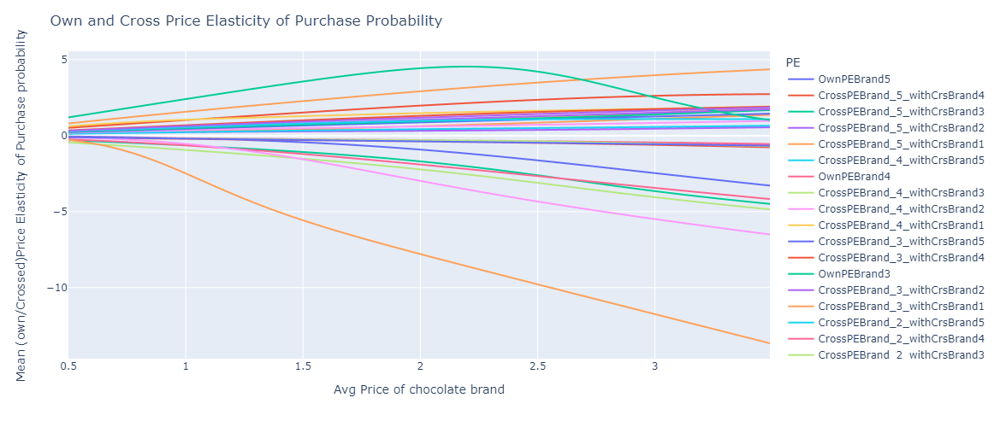

In [16]:
# print(PE_BrandChoice.columns[-26])
print('INTERACTIVE:')
PE_each_Segments=PE_BrandChoice.melt(id_vars=['PriceBrand5'],var_name='PE',value_name='PEValue',value_vars=PE_BrandChoice.columns[-26:])

fig=px.line(PE_each_Segments,x="PriceBrand5",y='PEValue',color='PE')
fig.update_layout(width=1100,height=500,title='Own and Cross Price Elasticity of Purchase Probability',
                  xaxis=dict(title='Avg Price of chocolate brand'),
                  yaxis=dict(title='Mean (own/Crossed)Price Elasticity of Purchase probability'))
fig.show()

# Segment wise Own and Cross Price Elasticity of Purchase probability of a specific Brand.

In [17]:
## Joining of two table using ID as index and to map data between Customer segmentation data and their choice brand and corresponding Price  
df_BrandChoice_SegmCol=purchase_data.copy()
df_BrandChoice_SegmCol.set_index('ID',inplace=True)
df_BrandChoice_SegmCol=df_BrandChoice_SegmCol.loc[df_BrandChoice_SegmCol['Incidence']==1,price+['Brand']].join(CustomerDemographicData['Segmentation_K_means'])
df_BrandChoice_SegmCol.head()

,Price_1,Price_2,Price_3,Price_4,Price_5,Brand,Segmentation_K_means
ID,,,,,,,
200000001,1.50,1.90,1.99,2.09,2.67,2,0
200000001,1.39,1.90,1.91,2.12,2.62,5,0
200000001,1.47,1.90,1.99,1.97,2.67,1,0
200000001,1.21,1.35,1.99,2.16,2.68,4,0
200000001,1.46,1.88,1.97,1.89,2.37,2,0


###

In [18]:
meanBrandPrice={
    1:'MeanPriceBrand1',
    2:'MeanPriceBrand2',
    3:'MeanPriceBrand3',
    4:'MeanPriceBrand4',
    5:'MeanPriceBrand5'
}
PriceBrand={
    1: 'PriceBrand1',
    2: 'PriceBrand2',
    3: 'PriceBrand3',
    4: 'PriceBrand4',
    5: 'PriceBrand5',
}
def OwnPriceEls_Input(brandInd,TotalNoOfBrand=5):
    # lsit of own price elasticity
    listForOwnPriceEls=[]
    for i in range(1,TotalNoOfBrand+1):
        if i ==brandInd:
            listForOwnPriceEls.append(PriceBrand[i])
        else:
            listForOwnPriceEls.append(meanBrandPrice[i])
    return listForOwnPriceEls
def CrossPriceEls_Input(CrossbrandInd,TotalNoOfBrand=5):
    listForCrsPriceEls=[]
    for i in range(1,TotalNoOfBrand+1):
        if i ==CrossbrandInd:
            listForCrsPriceEls.append(PriceBrand[i])
        else:
            listForCrsPriceEls.append(meanBrandPrice[i])
    return listForCrsPriceEls
# list is to store dataframe of cross and own price elasticity of purchase probability of each segments.
list_cont_df_BrandChoice_segm=[]
for segm in [0,1,2,3]:
    print('X'*90)
    df_BrandChoiceSpeciSegm=df_BrandChoice_SegmCol[df_BrandChoice_SegmCol['Segmentation_K_means']==segm]
    print(f'analyzing segm no {segm}... and shape of the dataframe containing segment data of {segm} is {df_BrandChoiceSpeciSegm.shape}')
    ## data extraction for training the each segm model
    X_train_segm=df_BrandChoiceSpeciSegm[price].values
    Y_train_segm=df_BrandChoiceSpeciSegm['Brand'].values
    model_BrandChoice_Speci_Segm=LogisticRegression(solver='sag',multi_class='multinomial').fit(X_train_segm,Y_train_segm)
    print(f'Train for multiple class logistic regression model for segm_{segm} is finished...')
  
    df_brandChoiceSpeciSegm_coef_=pd.DataFrame(np.transpose( model_BrandChoice_Speci_Segm.coef_))
    df_brandChoiceSpeciSegm_coef_.index=price
    df_brandChoiceSpeciSegm_coef_.columns=['Brand_1','Brand_2','Brand_3','Brand_4','Brand_5']    
    print(f'DataFrame Containing coefficient of input price for each brand. For segment no{segm}')
    display(df_brandChoiceSpeciSegm_coef_)
    ## dataframe to contains own price elasticity and cross price elasticity of each brand for a specific segment.
    df_BrandChoice_Crs_Els_spc_Segm=pd.DataFrame(np.arange(0.5,3.5,0.01),columns=['PricePoints'])
    for brand in range(5,0,-1):
        print(f'Selection of Brand...',brand)
        
        print('*'*90)
        for crossbrand in range(5,0,-1):
            if crossbrand==brand:
                beta=df_brandChoiceSpeciSegm_coef_.iloc[brand-1,brand-1]
                ownpriceList=OwnPriceEls_Input(brand)
                print(f"calculating Own Price Elasticity of Brand{brand}")
                print(f'Column Extracted',ownpriceList)
                print(f'Beta Value of Brand {brand}',beta)
                df_BrandChoice_Crs_Els_spc_Segm[f'OwnPEBrand{brand}']=beta*PE_BrandChoice[f'PriceBrand{brand}'].values*(1-model_BrandChoice_Speci_Segm.predict_proba(PE_BrandChoice[ownpriceList].values)[:,brand-1])
                print(f"Own price elasticity of brand{brand} is finished..")
            else:
                beta=df_brandChoiceSpeciSegm_coef_.iloc[crossbrand-1,brand-1]
                crosspriceList=CrossPriceEls_Input(crossbrand)
                print(f"column extracted",crosspriceList)
                print(f'Calculating Cross Price Elasticity of brand {brand} with cross price of brand {crossbrand}...')
                print(f'beta value of brand{brand} is',beta)
                df_BrandChoice_Crs_Els_spc_Segm[f"CrossPEBrand_{brand}_withCrsBrand{crossbrand}"]=beta*PE_BrandChoice[f'PriceBrand{crossbrand}'].values*(1-model_BrandChoice_Speci_Segm.predict_proba(PE_BrandChoice[crosspriceList].values)[:,brand-1])
                print(f"calculation of cross price elasticity of Brand{brand} with cross price of Brand{crossbrand} is finished...")            
    list_cont_df_BrandChoice_segm.append(df_BrandChoice_Crs_Els_spc_Segm.copy())


XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
analyzing segm no 0... and shape of the dataframe containing segment data of 0 is (7615, 7)
Train for multiple class logistic regression model for segm_0 is finished...
DataFrame Containing coefficient of input price for each brand. For segment no0


C:\Users\adadi\anaconda3\envs\DataScienceEnv\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



,Brand_1,Brand_2,Brand_3,Brand_4,Brand_5
Price_1,-3.644681,1.185001,1.259895,0.497806,0.701979
Price_2,0.506638,-1.665802,0.461546,0.308736,0.388881
Price_3,1.413597,0.590627,1.288445,-2.168759,-1.123911
Price_4,1.034561,-0.220017,1.044539,-1.606818,-0.252266
Price_5,0.043211,0.514052,0.112367,0.193503,-0.863133


Selection of Brand... 5
******************************************************************************************
calculating Own Price Elasticity of Brand5
Column Extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'MeanPriceBrand3', 'MeanPriceBrand4', 'PriceBrand5']
Beta Value of Brand 5 -0.8631333966882068
Own price elasticity of brand5 is finished..
column extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'MeanPriceBrand3', 'PriceBrand4', 'MeanPriceBrand5']
Calculating Cross Price Elasticity of brand 5 with cross price of brand 4...
beta value of brand5 is -0.2522656438821424
calculation of cross price elasticity of Brand5 with cross price of Brand4 is finished...
column extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'PriceBrand3', 'MeanPriceBrand4', 'MeanPriceBrand5']
Calculating Cross Price Elasticity of brand 5 with cross price of brand 3...
beta value of brand5 is -1.1239105782774406
calculation of cross price elasticity of Brand5 with cross price of Brand3 is finished...
column

C:\Users\adadi\anaconda3\envs\DataScienceEnv\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



,Brand_1,Brand_2,Brand_3,Brand_4,Brand_5
Price_1,-3.339300,1.180863,1.321362,0.655594,0.181481
Price_2,0.517150,-1.853201,0.546938,0.427156,0.361957
Price_3,0.954514,-1.026988,0.322248,0.196769,-0.446543
Price_4,0.504890,-0.135659,0.873465,-0.679753,-0.562943
Price_5,-0.007913,0.400830,0.862964,0.452871,-1.708752


Selection of Brand... 5
******************************************************************************************
calculating Own Price Elasticity of Brand5
Column Extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'MeanPriceBrand3', 'MeanPriceBrand4', 'PriceBrand5']
Beta Value of Brand 5 -1.7087518109218873
Own price elasticity of brand5 is finished..
column extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'MeanPriceBrand3', 'PriceBrand4', 'MeanPriceBrand5']
Calculating Cross Price Elasticity of brand 5 with cross price of brand 4...
beta value of brand5 is -0.5629430593608865
calculation of cross price elasticity of Brand5 with cross price of Brand4 is finished...
column extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'PriceBrand3', 'MeanPriceBrand4', 'MeanPriceBrand5']
Calculating Cross Price Elasticity of brand 5 with cross price of brand 3...
beta value of brand5 is -0.446543461873846
calculation of cross price elasticity of Brand5 with cross price of Brand3 is finished...
column 

C:\Users\adadi\anaconda3\envs\DataScienceEnv\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



,Brand_1,Brand_2,Brand_3,Brand_4,Brand_5
Price_1,-2.455835,1.391447,0.220083,0.368581,0.475723
Price_2,1.418573,-1.974225,-0.008950,0.597720,-0.033117
Price_3,2.178901,-0.590937,-0.574120,-0.658603,-0.355240
Price_4,0.991484,-0.150334,-0.047499,-1.298748,0.505096
Price_5,-0.490892,0.718566,0.001724,0.196329,-0.425728


Selection of Brand... 5
******************************************************************************************
calculating Own Price Elasticity of Brand5
Column Extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'MeanPriceBrand3', 'MeanPriceBrand4', 'PriceBrand5']
Beta Value of Brand 5 -0.4257277848329078
Own price elasticity of brand5 is finished..
column extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'MeanPriceBrand3', 'PriceBrand4', 'MeanPriceBrand5']
Calculating Cross Price Elasticity of brand 5 with cross price of brand 4...
beta value of brand5 is 0.5050964713228313
calculation of cross price elasticity of Brand5 with cross price of Brand4 is finished...
column extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'PriceBrand3', 'MeanPriceBrand4', 'MeanPriceBrand5']
Calculating Cross Price Elasticity of brand 5 with cross price of brand 3...
beta value of brand5 is -0.3552401766617615
calculation of cross price elasticity of Brand5 with cross price of Brand3 is finished...
column 

C:\Users\adadi\anaconda3\envs\DataScienceEnv\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



,Brand_1,Brand_2,Brand_3,Brand_4,Brand_5
Price_1,-2.472094,1.816911,0.387910,0.561096,-0.293824
Price_2,0.584829,-1.962444,0.340856,0.250022,0.786738
Price_3,1.202658,0.326250,-0.118944,-0.785955,-0.624009
Price_4,1.411773,0.152745,0.005665,-0.853399,-0.716784
Price_5,0.366504,1.744672,-0.714226,-0.065371,-1.331579


Selection of Brand... 5
******************************************************************************************
calculating Own Price Elasticity of Brand5
Column Extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'MeanPriceBrand3', 'MeanPriceBrand4', 'PriceBrand5']
Beta Value of Brand 5 -1.3315792294399635
Own price elasticity of brand5 is finished..
column extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'MeanPriceBrand3', 'PriceBrand4', 'MeanPriceBrand5']
Calculating Cross Price Elasticity of brand 5 with cross price of brand 4...
beta value of brand5 is -0.7167838169140806
calculation of cross price elasticity of Brand5 with cross price of Brand4 is finished...
column extracted ['MeanPriceBrand1', 'MeanPriceBrand2', 'PriceBrand3', 'MeanPriceBrand4', 'MeanPriceBrand5']
Calculating Cross Price Elasticity of brand 5 with cross price of brand 3...
beta value of brand5 is -0.6240094652357421
calculation of cross price elasticity of Brand5 with cross price of Brand3 is finished...
column

In [19]:
dict_BrandChoice_ElsPrcPurchProb_PerSegm={'PriceElsOfSegm_0':list_cont_df_BrandChoice_segm[0],
                                         'PriceElsOfSegm_1':list_cont_df_BrandChoice_segm[1],
                                         'PriceElsOfSegm_2':list_cont_df_BrandChoice_segm[2],
                                         'PriceElsOfSegm_3':list_cont_df_BrandChoice_segm[3],
                                        }

# Own Price Elasticity of Purchase Probability of Customer of each Segment is visualized here is this graph.
# Here is the observation.
* original Price Range of each brand  and Corresponding Own price Elasticity of 

| Brand | Original Price Range|Elasticity<br>ForSegment0|Elasticity<br>ForSegment1|Elasticity<br>ForSegment2|Elasticity<br>ForSegment3|
|---|---|---|---|---|---|
|Brand_1|1.10 to 1.59|Elastic (-)|Elastic(-)|Elastic (-)|Elastic(-)|
|Brand_2|1.26 to 1.90|Elastic (-)|Elasitc(-)|Elastic (-)|Elastic(-)|
|Brand_3|1.87 to 2.14|InElastic (+)|InElastic(+)|InElastic (+)|InElastic(+)|
|Brand_4|1.76 to 2.26|Elastic (-)|Elastic(-)|Elastic (-)|Elastic(-)|
|Brand_5|2.11 to 2.80|Elastic (-)|Elastic(-)|Elastic (-)|Elastic(-)|
## <u>Purchasing Behaviour of customer Segment-0<u/>:
* in customer segment 0 price elasticity of brand 5 is very inelastic in up to price point 2.48. which is highest price point any other brand could be inelastic. it also mean that up to price point 2.48 we can increase price of the brand 5 with out loosing any customers.
* brand 1 is inelastic for a very small price range so it very senisitive with increase in price.
* in elastic region also brand 1 is very sensitive to increase in price so purchase probability will decrease with highest rate with increase in price.
* after that brand 2 is very sensitive to the price. so purchase probability will decrease with second higher rate with increase in price next after brand 1.
* Brand 5 is less elastic with price in comparision to others. so in this segment price of brand 5 can be increased without losing in consumer of the product significantly with others.
* brand 3 has very unusual positive price elasticity and it suggest that purchase probability will increase with increae in price . since it is unusual and reason of this unusual behaviour is the lack of evident data to train the model properly.
* market share of brand-2 is around 41% and brand-5 has second highest market shsare which is 32%. brand-4 has 13% and brand-3 and brand-1 has lowest brand share which are 3% and 10% .
## <u>Purchasing Behaviour of Customer Segment-1<u/>:
* in segment-1 brand 4 is very inelastic up to price point 2.3 which is highest inelasticity seen in this segment and it also means that we can increase the price up 2.3 with out loosing any significant number of customers.
* Brand 1 is very sensitive to increase in price has very negligible inelastic price range.
* brand 1 also has highest price elasticity value which is in negative means if price will be increased then purchase probability of this brand will decrease in highest rate incompared to other brands.
* brand 5 and brand 2 has second highest negative price elasticity next to brand1. so with increse in price purchase probability of these brand will decrease.
* distribution of different type of chocolate brand is kind of same for this segment. Brand-2 has highest market share of around 29% and brand-4 has second highest 25% market share.
## <u>Purchasing Behaviour of Customer Segment-2<u/>:
* in Segment 2 brand-1 is very Elastic compared to others. and brand-2 is also Elastic next to brand-1.
* brand 3 and brand-4 has very less negative elasticity in compared to others So in segment 2 purchase probability of brand 5 and 3 wont decrease very slowly with increase in price in compared to other brand.
* In this segment the market share of brand 4 and 5 is same which around 26%. brand 2 has highest market share around 33%.

## <u>Purchasing Behaviour of Customer Segment-3<u/>:
* brand 1 and brand 2 are very elastic with the price of the own brand and thats also negatively . so it price will increae then purchase probablity will decrease.
* brand 3 and brand 4 has lowest price elasticity So if price will increase then purchase probality will decrease but not with that highest rate as brand 5,2 and 1.
* In this Segment Brand-2 has highest share around 60%. brand 1 around 17% and brand-5 around 11%.
  

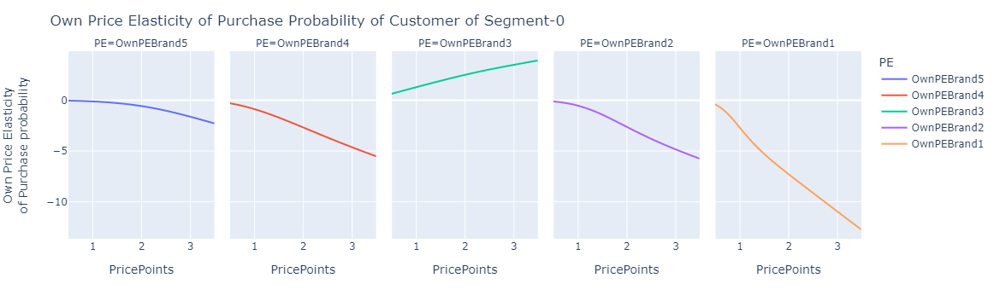

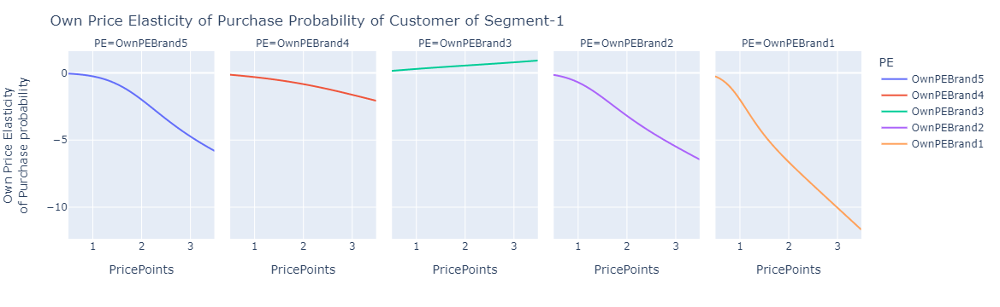

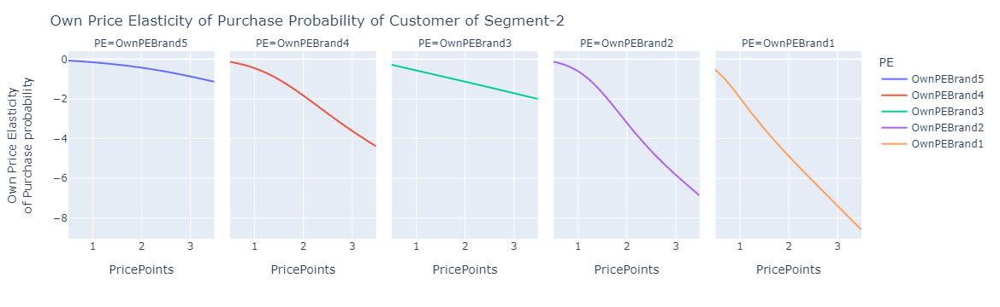

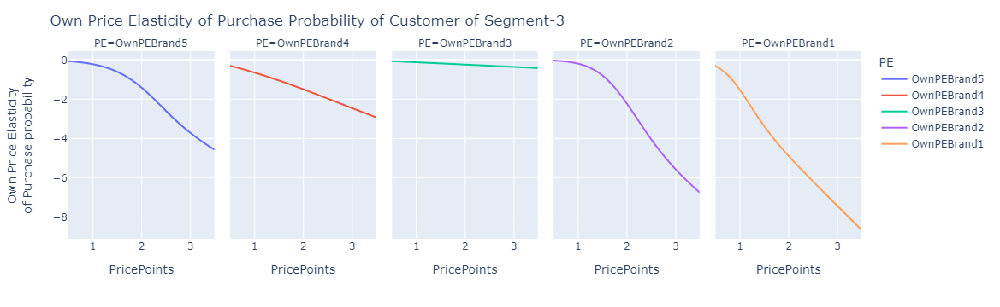

In [20]:
OwnPriceElsBrand=['PricePoints','OwnPEBrand5','OwnPEBrand4','OwnPEBrand3','OwnPEBrand2','OwnPEBrand1']
## for Customer Segment 0
PE_each_Segments=dict_BrandChoice_ElsPrcPurchProb_PerSegm['PriceElsOfSegm_0'][OwnPriceElsBrand].melt(id_vars=['PricePoints'],var_name='PE',value_name='PEValue')
fig=px.line(PE_each_Segments,x="PricePoints",y='PEValue',color='PE',facet_col='PE')
fig.update_layout(width=1180,height=300,title='Own Price Elasticity of Purchase Probability of Customer of Segment-0',
                  # xaxis=dict(title='Avg Price Range of chocolate brand'),
                  yaxis=dict(title='Own Price Elasticity<br>of Purchase probability')
                 )
fig.show()

## for Customer Segment 0
PE_each_Segments=dict_BrandChoice_ElsPrcPurchProb_PerSegm['PriceElsOfSegm_1'][OwnPriceElsBrand].melt(id_vars=['PricePoints'],var_name='PE',value_name='PEValue')
fig=px.line(PE_each_Segments,x="PricePoints",y='PEValue',color='PE',facet_col='PE')
fig.update_layout(width=1180,height=300,title='Own Price Elasticity of Purchase Probability of Customer of Segment-1',
                  # xaxis=dict(title='Avg Price Range of chocolate brand'),
                  yaxis=dict(title='Own Price Elasticity<br>of Purchase probability')
                 )
fig.show()


## for Customer Segment 2
PE_each_Segments=dict_BrandChoice_ElsPrcPurchProb_PerSegm['PriceElsOfSegm_2'][OwnPriceElsBrand].melt(id_vars=['PricePoints'],var_name='PE',value_name='PEValue')
fig=px.line(PE_each_Segments,x="PricePoints",y='PEValue',color='PE',facet_col='PE')
fig.update_layout(width=1180,height=300,title='Own Price Elasticity of Purchase Probability of Customer of Segment-2',
                  # xaxis=dict(title='Avg Price Range of chocolate brand'),
                  yaxis=dict(title='Own Price Elasticity<br>of Purchase probability')
                 )
fig.show()


## for Customer Segment 0
PE_each_Segments=dict_BrandChoice_ElsPrcPurchProb_PerSegm['PriceElsOfSegm_3'][OwnPriceElsBrand].melt(id_vars=['PricePoints'],var_name='PE',value_name='PEValue')
fig=px.line(PE_each_Segments,x="PricePoints",y='PEValue',color='PE',facet_col='PE')
fig.update_layout(width=1180,height=300,title='Own Price Elasticity of Purchase Probability of Customer of Segment-3',
                  # xaxis=dict(title='Avg Price Range of chocolate brand'),
                  yaxis=dict(title='Own Price Elasticity<br>of Purchase probability')
                 )
fig.show()

# Analysis of Own and Cross Price Elasticity of Purchasing Probability of the `Brand-5` by each segment. 

* in segment-0: brand 5 has positive cross price elasticity with brand 1 and brand 2 it means that with increase in price of these two brand purchase probabiltiy of brand 5 will increase. and it has negligible negative price elasticity with brand 4. so increasing of price of brand 4 won't affect purchase probability of brand 5.
* in segment-1: brand 5 has positive cross price elasticity with brand 1 and brand 2 but their magnitude is very less , numrically less than 1 so increase in price of this brand wont affect purchase probablity of brand 5. brand 3 and brand 4 has negative cross price elastiity which is very unusual in term of normal economic behavior . reason behind this might be lack of evident data of brand 3 and also reason might be the over fitting .
* in segment-2: brand 5 has positive cross price elastictiy with brand 4 and 5 and negligible elasticity with brand 2 . and with this we can say that brand 1 is strongest substitute of brand 5.
* in segment-3: brand 5 has positive cross price elasticity with brand 2 which is strongest substitute of brand 5. and rest of the brand has very unusual negative elasticity values. 

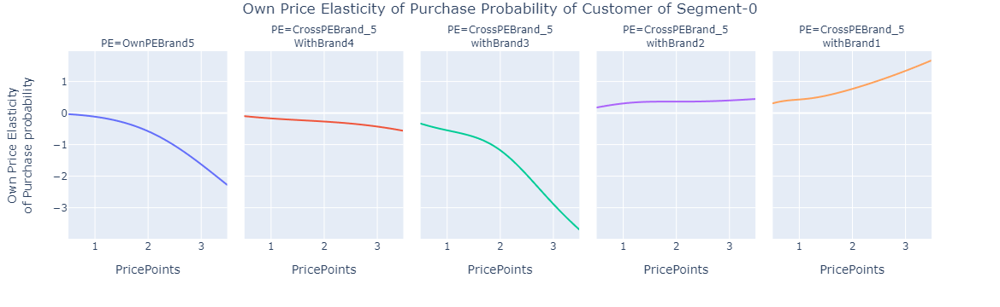

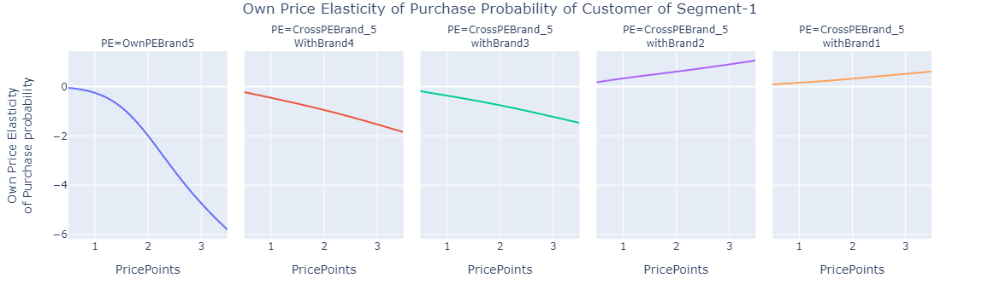

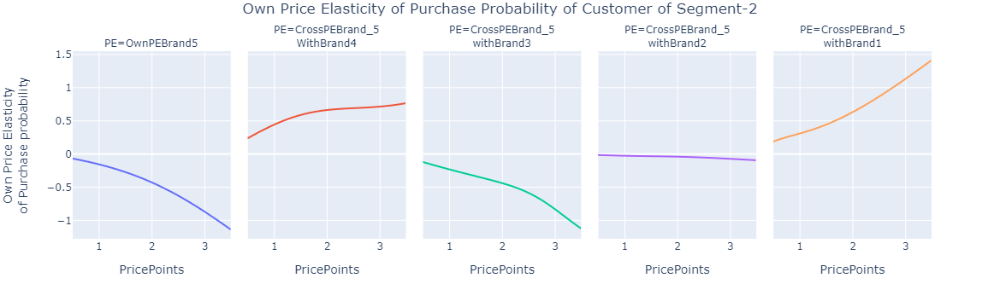

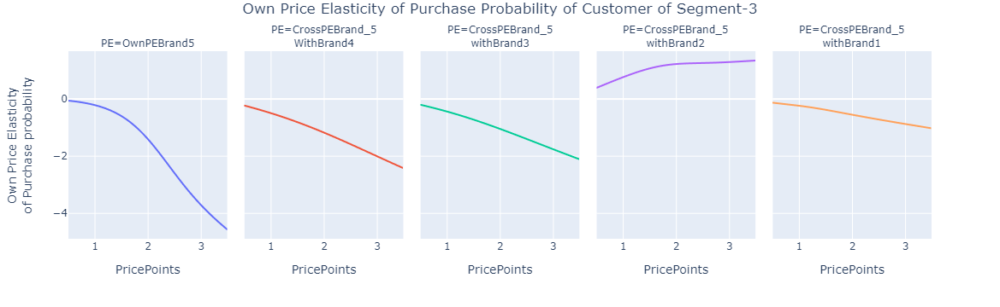

In [21]:
col_brand_5=['PricePoints', 'OwnPEBrand5',
             'CrossPEBrand_5_withCrsBrand4',
             'CrossPEBrand_5_withCrsBrand3',
             'CrossPEBrand_5_withCrsBrand2',
            'CrossPEBrand_5_withCrsBrand1']
for i,(key,df_PE_segm) in enumerate(dict_BrandChoice_ElsPrcPurchProb_PerSegm.items()):
    PE_each_Segments=df_PE_segm[col_brand_5].melt(id_vars=['PricePoints'],var_name='PE',value_name='PEValue').replace({
             'CrossPEBrand_5_withCrsBrand4':'CrossPEBrand_5<br>WithBrand4',
             'CrossPEBrand_5_withCrsBrand3':'CrossPEBrand_5<br>withBrand3',
             'CrossPEBrand_5_withCrsBrand2':'CrossPEBrand_5<br>withBrand2',
             'CrossPEBrand_5_withCrsBrand1':'CrossPEBrand_5<br>withBrand1'})
    fig=px.line(PE_each_Segments,x="PricePoints",y='PEValue',color='PE',facet_col='PE')
    fig.update_layout(width=1200,height=290,title=dict(text=f'Own Price Elasticity of Purchase Probability of Customer of Segment-{i}',
                                                      x=0.5,
                                                      y=0.99),
                      # xaxis=dict(title='Avg Price Range of chocolate brand'),
                      yaxis=dict(title='Own Price Elasticity<br>of Purchase probability')
                     )
    fig.update_layout(showlegend=False)
    fig.show()

# Analysis of Own and Cross Price Elasticity of Purchasing Probability of the `Brand-4` by each segment. 

* in segment-0: brand-4 has positive cross price elasticity with brand 5 ,1 and 2 but brand 1 is very strong substitute of brand-4 in comparision to other brands. cross price elasticity of brand 4 with brand 5 and 2 are less than 1. so increase or decrease in price of brand 5 and 2 wont affect purchase probability of brand 4.
* in segment-1:  similar to segment-0 brand 4 has postive cross price elasticity with brand-1 ,5,3, and 2 but brand-1 is strong substitute of brand 4 in comparision to others.
* in segment-2: in segment2 brand 2 and 1 has similar and stronger cross price elastictiy with brand 4. they are a substitute of brand 4. but brand-5 is weaker substitute of brand 4 cause their price elasticty value less than 1 in entire price range.
* in segment-3: in this segment also the brand 4 has strong positive cross price elasticity with brand 1. with brand 2 it show seconds highest cross price elasticity after brand-1.
* but in each segment brand 4 has very unusual cross price elasiticy curve with brand-3 which is very unusual in term of normal micro economic behavior. the reason behind this is the lack of evidence of brand 3 data.


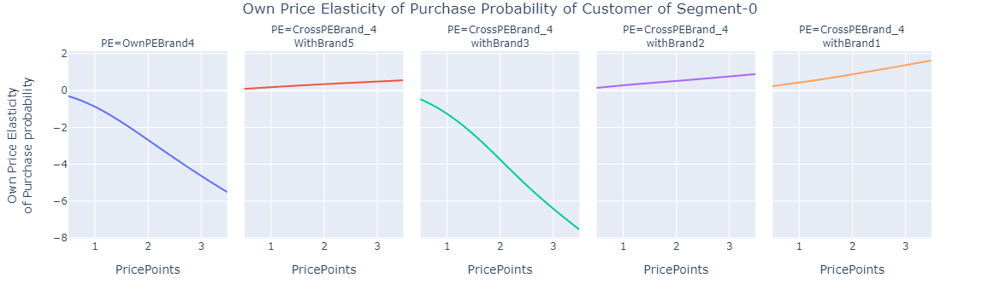

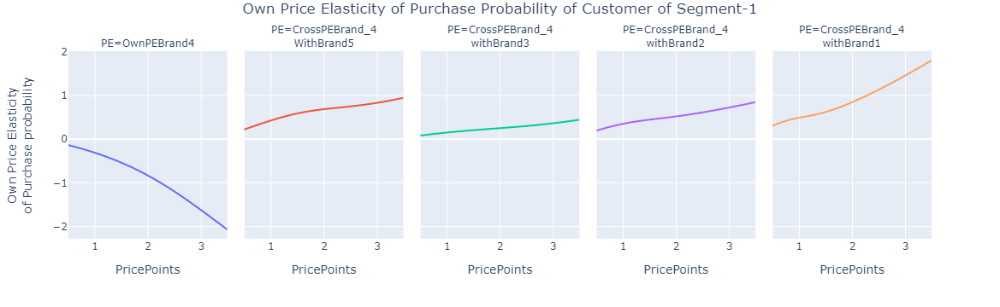

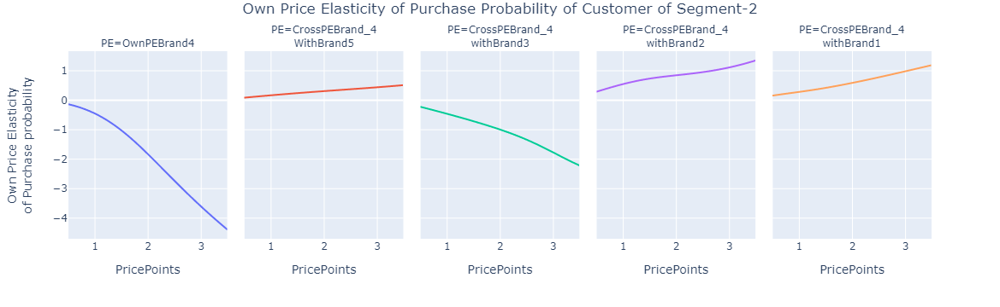

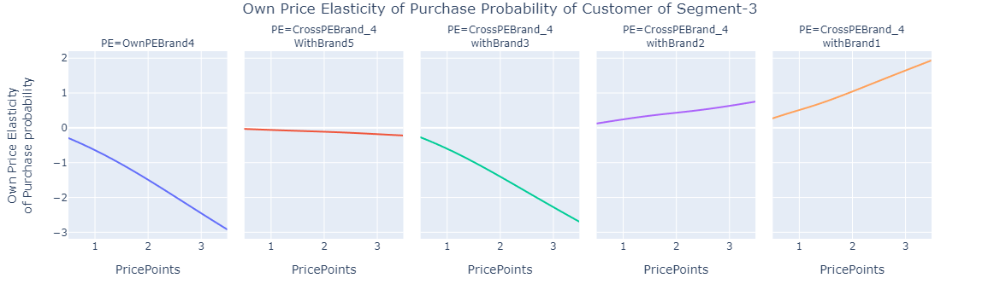

In [22]:
col_brand_5=['PricePoints', 'OwnPEBrand4',
             'CrossPEBrand_4_withCrsBrand5',
             'CrossPEBrand_4_withCrsBrand3',
             'CrossPEBrand_4_withCrsBrand2',
            'CrossPEBrand_4_withCrsBrand1']
for i,(key,df_PE_segm) in enumerate(dict_BrandChoice_ElsPrcPurchProb_PerSegm.items()):
    PE_each_Segments=df_PE_segm[col_brand_5].melt(id_vars=['PricePoints'],var_name='PE',value_name='PEValue').replace({
             'CrossPEBrand_4_withCrsBrand5':'CrossPEBrand_4<br>WithBrand5',
             'CrossPEBrand_4_withCrsBrand3':'CrossPEBrand_4<br>withBrand3',
             'CrossPEBrand_4_withCrsBrand2':'CrossPEBrand_4<br>withBrand2',
             'CrossPEBrand_4_withCrsBrand1':'CrossPEBrand_4<br>withBrand1'})
    fig=px.line(PE_each_Segments,x="PricePoints",y='PEValue',color='PE',facet_col='PE')
    fig.update_layout(width=1200,height=290,title=dict(text=f'Own Price Elasticity of Purchase Probability of Customer of Segment-{i}',
                                                      x=0.5,
                                                      y=0.99),
                      # xaxis=dict(title='Avg Price Range of chocolate brand'),
                      yaxis=dict(title='Own Price Elasticity<br>of Purchase probability')
                     )
    fig.update_layout(showlegend=False)
    fig.show()

# Analysis of Own and Cross Price Elasticity of Purchasing Probability of the `Brand-3` by each segment. 

* the Plot of own price and cross price Elasticity of purchase probability of brand-3 is very unusual. it is observed that own price elasticity are positive and inelastic in entire price range. it is positive mean that purchase probability will increase with it price but since curve is inelastic so change in price wont affect therotically. But reason why curve is very unusual, might be the lack of evident data of purchase incidence for brand-3, So model has not been trained properly yet.

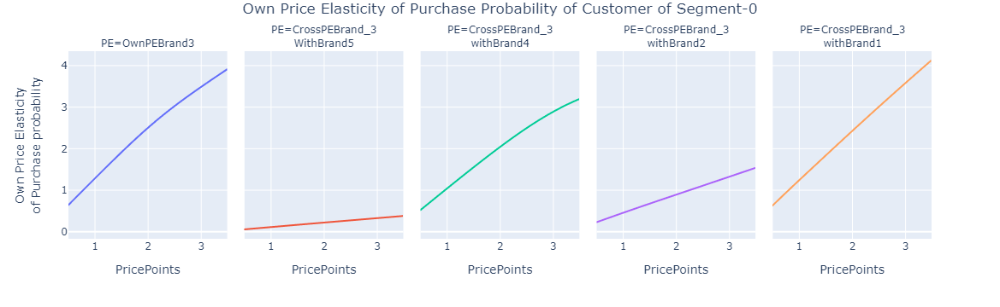

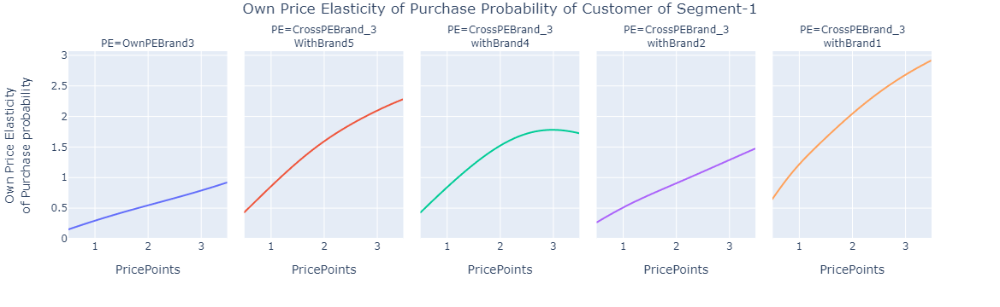

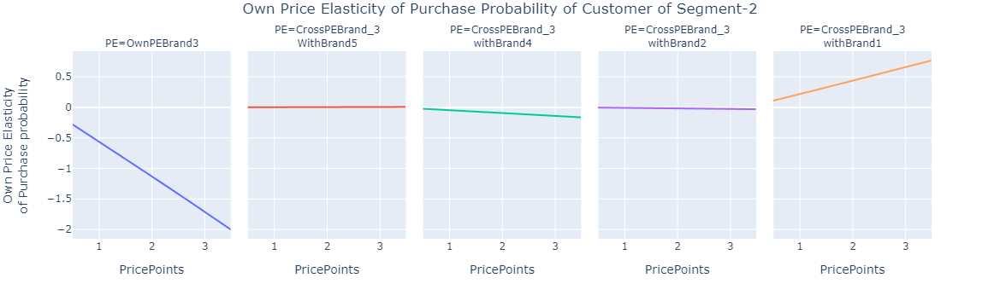

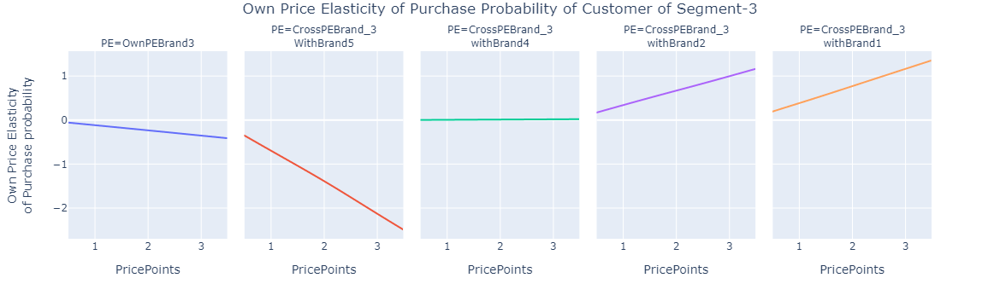

In [23]:
col_brand_5=['PricePoints', 'OwnPEBrand3',
             'CrossPEBrand_3_withCrsBrand5',
             'CrossPEBrand_3_withCrsBrand4',
             'CrossPEBrand_3_withCrsBrand2',
            'CrossPEBrand_3_withCrsBrand1']
for i,(key,df_PE_segm) in enumerate(dict_BrandChoice_ElsPrcPurchProb_PerSegm.items()):
    PE_each_Segments=df_PE_segm[col_brand_5].melt(id_vars=['PricePoints'],var_name='PE',value_name='PEValue').replace({
             'CrossPEBrand_3_withCrsBrand5':'CrossPEBrand_3<br>WithBrand5',
             'CrossPEBrand_3_withCrsBrand4':'CrossPEBrand_3<br>withBrand4',
             'CrossPEBrand_3_withCrsBrand2':'CrossPEBrand_3<br>withBrand2',
             'CrossPEBrand_3_withCrsBrand1':'CrossPEBrand_3<br>withBrand1'})
    fig=px.line(PE_each_Segments,x="PricePoints",y='PEValue',color='PE',facet_col='PE')
    fig.update_layout(width=1200,height=290,title=dict(text=f'Own Price Elasticity of Purchase Probability of Customer of Segment-{i}',
                                                      x=0.5,
                                                      y=0.99),
                      # xaxis=dict(title='Avg Price Range of chocolate brand'),
                      yaxis=dict(title='Own Price Elasticity<br>of Purchase probability')
                     )
    fig.update_layout(showlegend=False)
    fig.show()

# Analysis of Own and Cross Price Elasticity of Purchasing Probability of the `Brand-2` by each segment. 

* segment-0: brand 1 is the stonger substitute of brand-2 cause brand-2 has positive cross price elasticity and value of the elasticity at every price point is greater than 1. brand 5 and 3 also second strong substitutes of brand 2 next to brand 1. but they have lower than and near to 1 cross price elasticity in entire price range.
* segment-1: in this segment only brand 1 is a substitute of brand 2 . rest of the brand has very negligible cross price elasticity.
* segment-2: brand-5 and brand 1 are very stong substitute of brand 2 cause they have greater than 1 positive cross price elascity .
* segment-3: brand 5 and brand 1 are very stong substitute fo brand 2. and brand 5 is the strongest. 

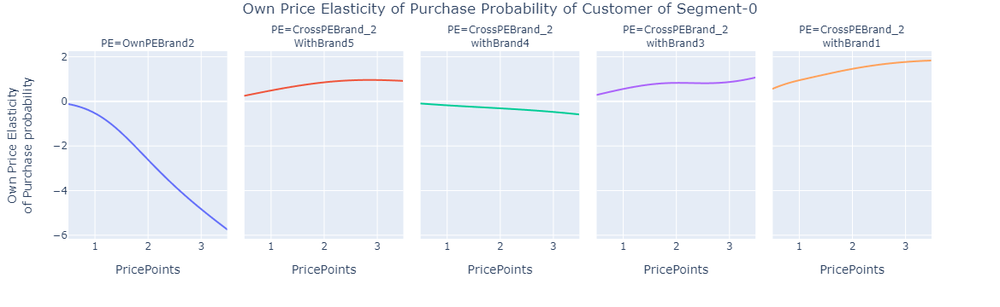

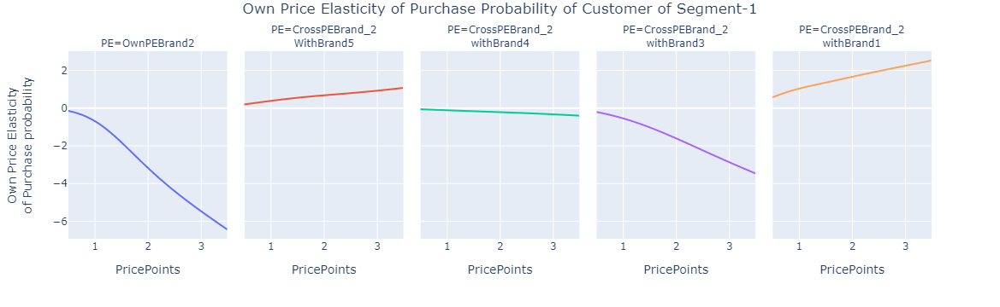

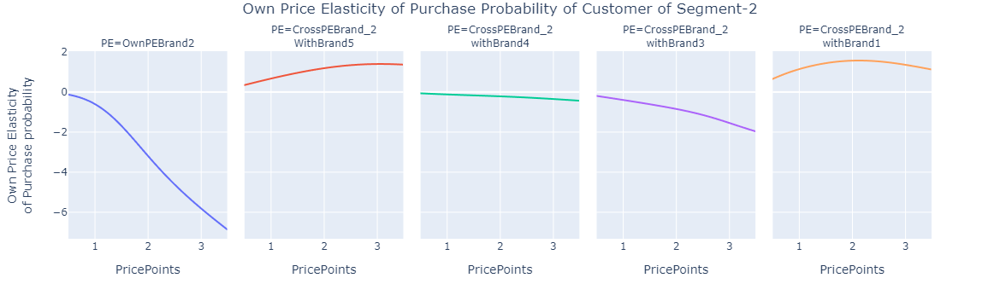

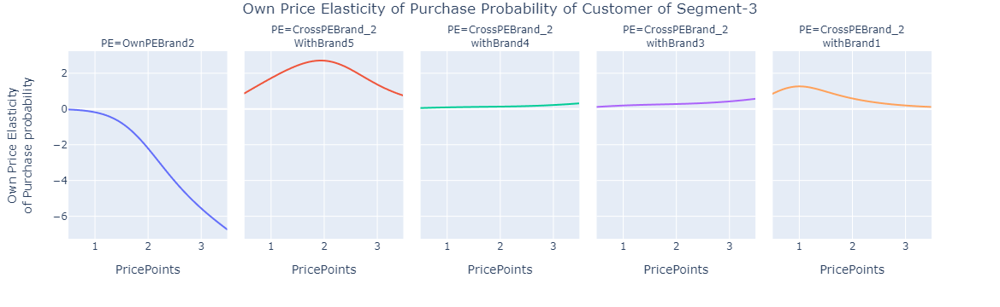

In [24]:
col_brand_5=['PricePoints', 'OwnPEBrand2',
             'CrossPEBrand_2_withCrsBrand5',
             'CrossPEBrand_2_withCrsBrand4',
             'CrossPEBrand_2_withCrsBrand3',
            'CrossPEBrand_2_withCrsBrand1']
for i,(key,df_PE_segm) in enumerate(dict_BrandChoice_ElsPrcPurchProb_PerSegm.items()):
    PE_each_Segments=df_PE_segm[col_brand_5].melt(id_vars=['PricePoints'],var_name='PE',value_name='PEValue').replace({
             'CrossPEBrand_2_withCrsBrand5':'CrossPEBrand_2<br>WithBrand5',
             'CrossPEBrand_2_withCrsBrand4':'CrossPEBrand_2<br>withBrand4',
             'CrossPEBrand_2_withCrsBrand3':'CrossPEBrand_2<br>withBrand3',
             'CrossPEBrand_2_withCrsBrand1':'CrossPEBrand_2<br>withBrand1'})
    fig=px.line(PE_each_Segments,x="PricePoints",y='PEValue',color='PE',facet_col='PE')
    fig.update_layout(width=1200,height=290,title=dict(text=f'Own Price Elasticity of Purchase Probability of Customer of Segment-{i}',
                                                      x=0.5,
                                                      y=0.99),
                      # xaxis=dict(title='Avg Price Range of chocolate brand'),
                      yaxis=dict(title='Own Price Elasticity<br>of Purchase probability')
                     )
    fig.update_layout(showlegend=False)
    fig.show()

# Analysis of Own and Cross Price Elasticity of Purchasing Probability of the `Brand-1` by each segment. 

* segment-0: brand 3,4, and 2 are very storg substitute and brand 3 is strongest and after that brand 4 is second strongest substitute.
* segment-1: similar to segment1 segment 2 also has similar stonger substitute and they are brand 4,3 and 2.
* segment-2: segment 3 also have similar stong substitutes.
* segment-3: segment 4 also has similar strong substitutes.
* but every observation that has found about brand 3 can not be stated with high confidence due to lack of evident data.

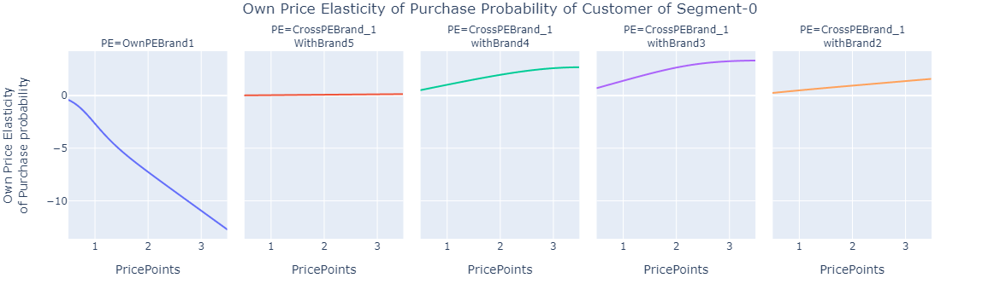

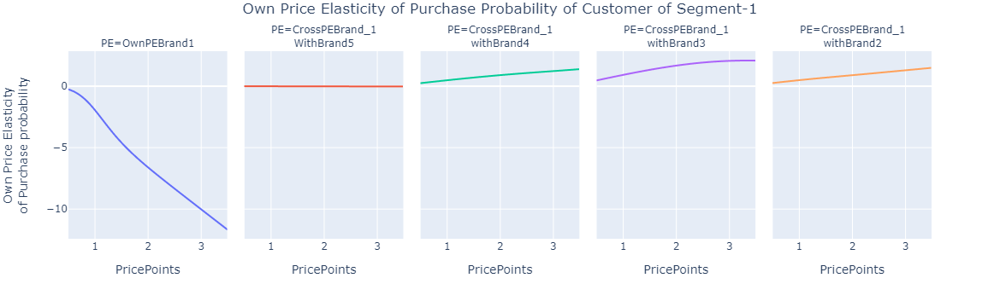

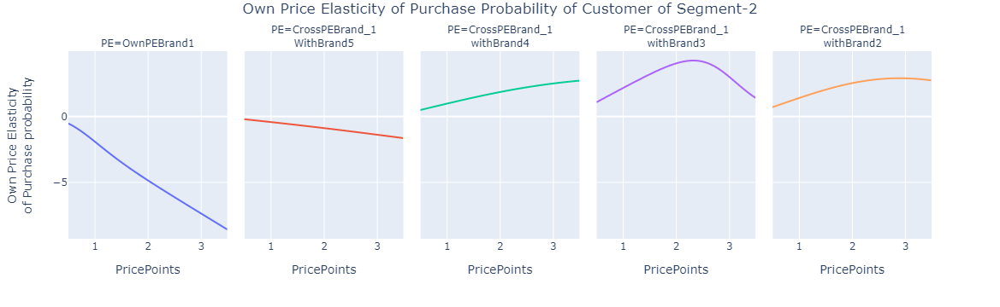

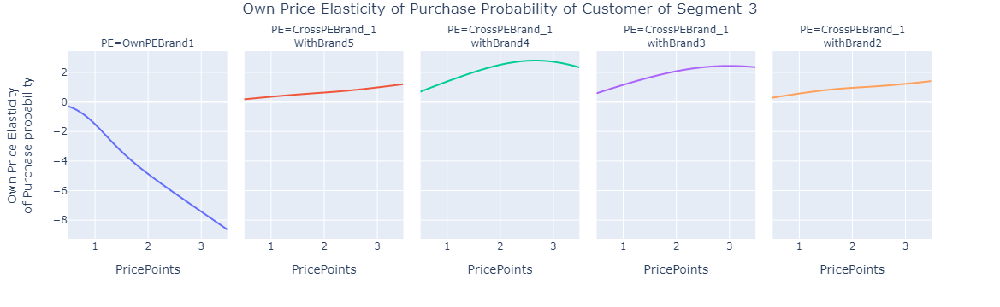

In [25]:
col_brand_5=['PricePoints', 'OwnPEBrand1',
             'CrossPEBrand_1_withCrsBrand5',
             'CrossPEBrand_1_withCrsBrand4',
             'CrossPEBrand_1_withCrsBrand3',
            'CrossPEBrand_1_withCrsBrand2']
for i,(key,df_PE_segm) in enumerate(dict_BrandChoice_ElsPrcPurchProb_PerSegm.items()):
    PE_each_Segments=df_PE_segm[col_brand_5].melt(id_vars=['PricePoints'],var_name='PE',value_name='PEValue').replace({
             'CrossPEBrand_1_withCrsBrand5':'CrossPEBrand_1<br>WithBrand5',
             'CrossPEBrand_1_withCrsBrand4':'CrossPEBrand_1<br>withBrand4',
             'CrossPEBrand_1_withCrsBrand3':'CrossPEBrand_1<br>withBrand3',
             'CrossPEBrand_1_withCrsBrand2':'CrossPEBrand_1<br>withBrand2'})
    fig=px.line(PE_each_Segments,x="PricePoints",y='PEValue',color='PE',facet_col='PE')
    fig.update_layout(width=1200,height=290,title=dict(text=f'Own Price Elasticity of Purchase Probability of Customer of Segment-{i}',
                                                      x=0.5,
                                                      y=0.99),
                      # xaxis=dict(title='Avg Price Range of chocolate brand'),
                      yaxis=dict(title='Own Price Elasticity<br>of Purchase probability')
                     )
    fig.update_layout(showlegend=False)
    fig.show()